# Audio Classification using spectrographs on VGG19 CNN

## DO NOT RUN CELLS HERE/ THERE ARE SPECIFIC CELLS to run,or it will make you life harder,

i commented on which cells to run!


## linux cmds and library installations

In [ ]:
!pip install librosa

In [ ]:
!pip install kaggle

In [ ]:
!mkdir /root/.kaggle/

--> this cell <--

## kaggle API and boiler plate stuff(dataset retrival/unpacking)

In [ ]:
!cp /content/drive/MyDrive/"Colab Notebooks"/kaggle_api/kaggle.json /root/.kaggle/

In [ ]:
!kaggle datasets download -d andradaolteanu/gtzan-dataset-music-genre-classification

100% 1.21G/1.21G [00:12<00:00, 114MB/s]
100% 1.21G/1.21G [00:12<00:00, 100MB/s]


In [ ]:
!unzip -d /content/data/ /content/gtzan-dataset-music-genre-classification.zip

Archive:  /content/gtzan-dataset-music-genre-classification.zip
  inflating: /content/data/Data/features_30_sec.csv  
  inflating: /content/data/Data/features_3_sec.csv  
  inflating: /content/data/Data/genres_original/blues/blues.00000.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00001.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00002.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00003.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00004.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00005.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00006.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00007.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00008.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00009.wav  
  inflating: /content/data/Data/genres_original/blues/blues.00010.wav  
  inflating: /content/data/Data/genre

## library imports

### rudimentary imports

In [ ]:
import pandas as pd
import numpy as np
import librosa 
import librosa.display as ld
import IPython.display as ipd
from scipy.io import wavfile

### graphing libs 

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px  #plots and graphing lib
from plotly.subplots import make_subplots
import plotly.graph_objects as go

### tensorflow imports

In [ ]:
#------------tensorflow imports----------------
import tensorflow
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image

## sampling and data inspection

In [ ]:
sample_audio_dir = "/content/data/Data/genres_original/classical/classical.00090.wav"

In [ ]:
ipd.Audio(sample_audio_dir)

MY english got 10x better (only)while listening to this 

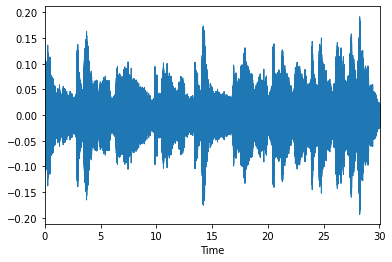

In [ ]:
y, sr = librosa.load(sample_audio_dir)
hiphop, _ = librosa.effects.trim(y)
librosa.display.waveplot(hiphop, sr=sr);

In [ ]:
def spectrogram_vis(hiphop):
  n_fft = 2048
  hop_length = 512
  D = np.abs(librosa.stft(hiphop, n_fft=n_fft,  hop_length=hop_length))
  DB = librosa.amplitude_to_db(D, ref=np.max)
  librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
  plt.colorbar(format='%+2.0f dB')

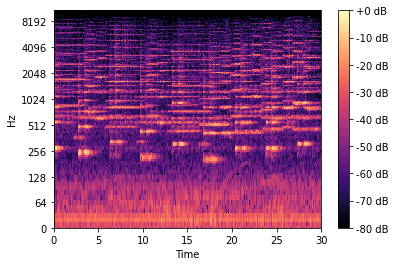

In [ ]:
spectrogram_vis(hiphop)

## tensor shapes and preprocessing inputs 

In [ ]:
spectrum = tensorflow.keras.preprocessing.image.img_to_array(tensorflow.keras.preprocessing.image.load_img("/content/data/Data/images_original/classical/classical00002.png"))

In [ ]:
spectrum.shape

(288, 432, 3)

In [ ]:
image_size = [288,432]

### model retrival and head building 

In [ ]:
#instantiate model
ptm = VGG19(input_shape=image_size + [3],weights = "imagenet",classes = 10, include_top=False)
ptm.trainable = False
x = tensorflow.keras.layers.Flatten()(ptm.output)
o = tensorflow.keras.layers.Dense(512,activation = "relu")(x)
o = tensorflow.keras.layers.Dense(256,activation = "relu")(o)
o = tensorflow.keras.layers.Dense(128,activation = "relu")(o)
o = tensorflow.keras.layers.Dense(64,activation = "relu")(o)
o = tensorflow.keras.layers.Dense(10,activation = "softmax")(o)
model = Model(ptm.input,o)

80142336/80134624 [==============================] - 1s 0us/step


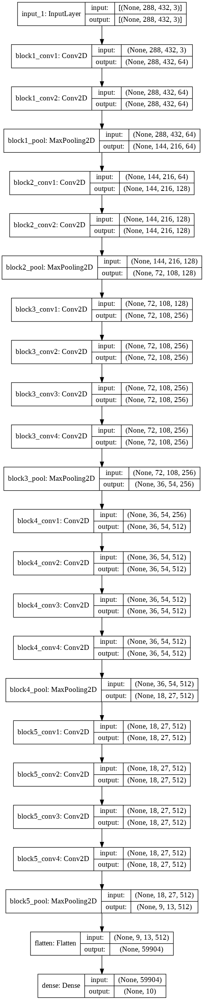

In [ ]:
tensorflow.keras.utils.plot_model(model, show_shapes=True, expand_nested=True)

## Data generators and preprocessing 

In [ ]:
batch_size = 128

train_datagen = ImageDataGenerator(
  rotation_range=20,
  width_shift_range=0.1,
  height_shift_range=0.1,
  shear_range=0.1,
  zoom_range=0.2,
  horizontal_flip=True,
  preprocessing_function=preprocess_input
)
# create generators
train_generator = train_datagen.flow_from_directory(
  "/content/data/Data/images_original/",
  shuffle=True,
  target_size=image_size,
  batch_size=batch_size,
)

Found 999 images belonging to 10 classes.


## model compile and training

In [ ]:
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [ ]:
history = model.fit(
  train_generator,
  epochs=100,
  steps_per_epoch=int(np.ceil(999/ batch_size)),
  validation_steps=int(np.ceil(999/ batch_size)),
)

Epoch 1/100
8/8 [==============================] - 110s 7s/step - loss: 31.3780 - accuracy: 0.0921
Epoch 2/100
8/8 [==============================] - 31s 4s/step - loss: 14.4028 - accuracy: 0.2152
Epoch 3/100
8/8 [==============================] - 32s 4s/step - loss: 5.1270 - accuracy: 0.3313
Epoch 4/100
8/8 [==============================] - 33s 4s/step - loss: 3.1051 - accuracy: 0.4154
Epoch 5/100
8/8 [==============================] - 32s 4s/step - loss: 2.1677 - accuracy: 0.5005
Epoch 6/100
8/8 [==============================] - 33s 4s/step - loss: 1.7719 - accuracy: 0.5556
Epoch 7/100
8/8 [==============================] - 32s 4s/step - loss: 1.5976 - accuracy: 0.5485
Epoch 8/100
8/8 [==============================] - 32s 4s/step - loss: 1.3947 - accuracy: 0.5936
Epoch 9/100
8/8 [==============================] - 32s 4s/step - loss: 1.2049 - accuracy: 0.6206
Epoch 10/100
8/8 [==============================] - 33s 4s/step - loss: 1.2526 - accuracy: 0.6356
Epoch 11/100
8/8 [========

saving model to avoid PAIN ! and ploting loss/acc

In [ ]:
model.save("/content/drive/MyDrive/Colab Notebooks/trained_models/audio classi/vgg19_head_100epochs.h5")

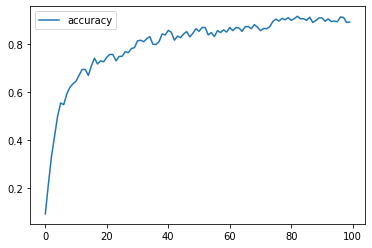

In [ ]:
plt.plot(history.history["accuracy"], label = "accuracy")
plt.legend()

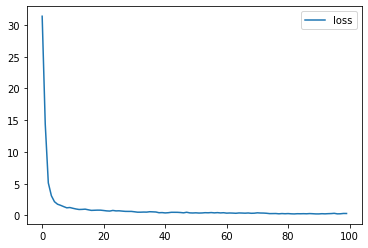

In [ ]:
plt.plot(history.history["loss"], label = "loss")
plt.legend()

# DO NOT RUN ABOVE CELLS 

RUN cells FORM HERE to end of notebook

## some more linux CMDS

In [ ]:
!mkdir /content/test_folder/

In [ ]:
!mkdir /content/spec_store/

## model_retrival (ensure model is in drive)

In [ ]:
model = tensorflow.keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/trained_models/audio classi/vgg19_head_50epochs.h5")

## prepare to anal

### target dict and helper functions for each 

In [ ]:
target_dict = {0:"blues",1:"classical",2:"country",3:"disco",4:"hiphop",
                 5:"jazz",6:"metal",7:"pop",8:"reggae",9:"rock"}

In [ ]:
def dic_maker_tuple(tuple_arr):
  """ takes in [(x,y),(a,b)]
      outputs {x:y,a:b} (basically some formatting to make life easier)
  """
  dict_ = {}
  for tuple_ in tuple_arr:
    dict_[target_dict[tuple_[0]]] = tuple_[1]
  return dict_
def dic_maker(arr):
  """ dis takes in arr [[prob(1),prob(2),prob(3)......prob(n)]]
   and outputs [(1,prob(1)),(2,prob(2))]
   (basically some formatting to make life easier)"""
  dict_ = {}
  for ind in range(len(arr[0])):
    dict_[ind] = arr[0][ind]
  return sorted(dict_.items(), key=lambda x: x[1],reverse=True)[:3]

In [ ]:
def spect_no_gen_img(spec):
  """ 
  prediction happens in this function
  super important, takes in image_path (/content/test_1/test/111.jpg)
  outputs: {1:prob(1),2:prob(2)}
  """
  image_1 = tensorflow.keras.preprocessing.image.load_img(spec)
  input_arr = tensorflow.keras.preprocessing.image.img_to_array(image_1)
  input_arr = preprocess_input(input_arr)
  input_arr = tensorflow.image.resize(input_arr,size = (288,432))

  input_arr = tensorflow.expand_dims(input_arr, -1)
  input_arr = np.array([input_arr])  # Convert single image to a batch.
  predictions = model.predict(input_arr)
  return dic_maker_tuple(dic_maker(predictions))

### very imp function makes the UI possible as opposed to CLI output

In [ ]:
def spectrographic_anal(wav_path,name = "test"):
  y, sr = librosa.load(wav_path)
  hiphop, _ = librosa.effects.trim(y)
  n_fft = 2048
  hop_length = 512
  D = np.abs(librosa.stft(hiphop, n_fft=n_fft,  hop_length=hop_length))
  DB = librosa.amplitude_to_db(D, ref=np.max)
  librosa.display.specshow(DB, sr=sr, hop_length=hop_length)
  plt.savefig(f"/content/spec_store/{name}.png")
  plt.close()

  test_imgs = f"/content/spec_store/{name}.png"
  fig = make_subplots(rows=1, cols=2)
  pred_list = spect_no_gen_img(test_imgs)
  fig.append_trace(go.Image(z=np.array(image.load_img(test_imgs))),1,1)
  fig.append_trace(go.Bar(y = list(pred_list.keys()), x = list(pred_list.values()),orientation='h'),1,2)
  fig.update_layout(height= 400, title_text="Spectrograph/prediction",showlegend = False)
  fig.show()

### testing here

some instructions!


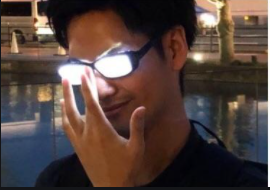

- **step 1**: see the test_folder in directories?, 
- ***step 2*** : upload ur audio files IN .WAV FORMAT(~30Sec long/not more than that, or results are unpredictible)
- ***step 3*** : upload only one wav file at a time.
- ***step 4*** : when u hover over wav file after uploading, see the "3 dots",click on them and select "copy path" 
- ***step 5*** : paste it in cell below and run all 3 cells below "instruction" cell
- ***step 6*** : profit!

In [ ]:
#testing
test_dir = "/content/test_folder/test1.wav"

In [ ]:
ipd.Audio(test_dir)

In [ ]:
spectrographic_anal(test_dir)